# [IAPR][iapr]: Project


**Group ID:** 32

**Author 1 (sciper):** Ghali CHRAIBI (262251)  
**Author 2 (sciper):** Yann Yasser HADDAD (272292)   
**Author 3 (sciper):** Julien BERGER (xxxxx)   

**Release date:** 07.05.2021  
**Due date:** 03.06.2021 (23h59)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class as well as preparation for the final project, which is a practical project which ties together the topics of the course. 

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook !** rerun the notebook from scratch `Kernel` > `Restart & Run All`


[iapr]: https://github.com/LTS5/iapr

## Imports 

In [1]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import skimage.io

from utils import print_results, evaluate_game

from skimage.transform import resize
from skimage.transform import rescale
from skimage.util import img_as_ubyte
#plt.imshow(resize(im_1, (100, 100)))
#plt.imshow(rescale(grayscale, 0.3, anti_aliasing=True)) # return a gray_scaled image fro 0-1 ! --> use img_as_ubyte
#img_as_ubyte(rescale(grayscale, 0.3, anti_aliasing=True))
from skimage.filters import laplace, prewitt, sobel, roberts
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops, regionprops_table
from skimage.filters import threshold_multiotsu,  difference_of_gaussians, threshold_isodata, threshold_mean, threshold_yen, threshold_sauvola, threshold_niblack, threshold_triangle, threshold_li, threshold_local 
from skimage.color import rgb2hsv
from skimage.util import img_as_ubyte
import cv2
from skimage.morphology import disk, square
from skimage.filters import median, gaussian
from skimage.feature import canny
from scipy import ndimage as ndi
from skimage.filters import median
from skimage.morphology import binary_opening
from skimage.morphology import square, closing, binary_closing, opening
from skimage.morphology import remove_small_objects
from skimage.measure import find_contours
import plotly.express as px
import plotly.graph_objects as go
from skimage import data, filters, measure, morphology

---
## 0. Introduction

An anonymous researcher that we will name Lann Yecun is convinced that the MNIST dataset still has great potential. He decides to create a playing card game based on MNIST digits and different figures. The game uses a standard 52 card deck which is composed of four French suits/colours: clubs (&#9827;), diamonds (&#9830;), hearts (&#9829;) and spades (&#9824;). Each suit includes 10 digit cards (from 0 to 9) and 3 figures (Jack-J, Queen-Q, and King-K). Here is an example of the 13 spade cards with their name.


<img src="data/media/example_cards.png">


We can find the same arrangement of cards for the clubs, diamonds, and hearts. 


## 1. Rules


### 1.1 Standard

The rules are based on the simple battle card game. The goal of the game is to win as many points as possible. Each turn, the 4 players play a card in front of them. As displayed in the example below. The rules are the following:

- The cards are ranked in the following order : **0 < 1 < 2 < 3 < 4 < 5 < 6 < 7 < 8 < 9 < J < Q < K**.
- The player with the highest-ranked card wins the round and obtains **1 point**. 
- If the highest-ranked card is the same for multiple players we call it a draw and all winners get **1 points**. 
- In this configuration, we **do not** take into account the suits. The game only rely on the card ranks. 
- The game lasts 13 rounds. After the last round, the winner is the player that has the largest number of points. 
- In the example below Player 1 wins the round with his Queen ( 0 < 8 < J < **Q**).

If two or more players have the same number of points they share the victory.

### 1.2 Advanced

The advanced rules take into account the suits. 

- At the beginning of **each round** a random player is designated as the **dealer**. The dealer places a green token with the letter *D* next to him (player 1 in the example below).
- Only the cards that belong to the same suit as the one of the dealer are considered valid. In the example below, only Player 4 is competing with Player 1 as spade was selected by the dealer (e.i., Player 1). Player 2 and 3 are out for this round. Player 1 wins the round and **1 point** with the Queen ( 0&#9824; < **Q&#9824;**).
- There cannot be any draw between the players as they are not any card duplicates.
- We use the same system as the standard method to count the points.


<img src="data/media/example_round.jpg">


### 1.3 Notes

- The orientation of the card is linked to the position of the player around the table. For instance, to read the card of the 3rd player you will have to rotate it by 180°.
- The **digits** always **face** the players around the table. The figures can have random orientations.
- Player 1 **always** seats south of the table. The players are **always** ordered counter-clockwise as in the example. 
- The dealers can change between the rounds and games.
- Some cards **might** apear multiple times per game.
- Pictures are always taken from rougthly the same altitude.
- The digits from the training set **would not** be the same as the one of the testing set.

---
## 2. Data

You will be given the images of 7 games that were played ([download link](https://drive.google.com/drive/folders/1fEy27wnJsUJPRsEEomzoAtP56s-7HFtk?usp=sharing)). The data are composed of:
   - 7 folder named after the games (game1 to game7).
   - Each game includes 13 ordered images (1st to 13th round).
   - Each game includes a csv file with the ground truth of the game. The first row list the players (P1 to P4) as well as the dealer (D). The following rows represent the rounds (1 to 13). We represent the card played with 2 character as $AB$ where $A \in [0-9, J, Q, K]$ is the rank of the card and $B \in [C, D, H, S]$ is the suit. For example, QS means "(Q)ueen of (S)pade" and 0D means "(0) of (D)iamond". The dealer is represented by the ID of the player (e.g. P1 -> 1).
   
You are free to use external datasets such as the original MNIST train set that you used in lab 3.

### Data loading

In [3]:
train_data = 'data/train_games'
train_game_count = 7
game_round_count = 13

dict_data = {}

for i in range(1, train_game_count+1):
    # For each game, store the path of the csv and the image of each round
    dict_data[f'game{i}'] = {}
    dict_data[f'game{i}']['url'] = train_data + f'/game{i}'
    dict_data[f'game{i}']['csv'] = train_data + f'/game{i}.csv'
    
    for j in range(1, game_round_count+1):
        dict_data[f'game{i}'][f'round{j}'] = skimage.io.imread(train_data + f'/game{i}/{j}.jpg')

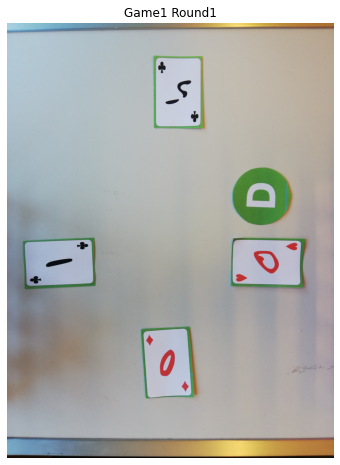

In [4]:
fig, ax = plt.subplots(1, 1, figsize=(8,8))
ax.imshow(dict_data['game3']['round7'])
ax.set_title('Game1 Round1')
ax.axis('off')
plt.show()

---
## 3. Your Tasks

Your task is to ready yourself for the final evaluation. The day of the exam we will give you a new folder with a new game. ! The digits on the cards **differ** from the one of the traning set. When given a new data folder with 13 images your should be able to:

**Task 0**
   - Plot an overlay for each round image that shows your detections and classification. You can for example plot bounding boxes around the cards/dealer token and add a text overlay with the name of the classes.

**Task 1**
   - (a) Predict the **rank** of the card played by each player at each round (Standard rules).
   - (b) Predict the **number of points** of each player according to **Standard** rules
 
**Task 2**
   - (a) Detect which player is the selected **dealer** for each round.
   - (b) Predict the **rank** and the **suit** of the card played by each player at each round (Advanced rules).
   - (c) Predict the **number of points** of each player according to **Advanced** rules

---

**Before the exam (until 03.06.21 at 23h59)**
   - Create a zipped folder named **group_xx.zip** that you upload on moodle (xx being your group number).
   - Include a **runnable** code (Jupyter Notebook and external files) and your presentation in the zip folder.
   
**The day of the exam (04.06.21)**
   - You will be given a **new folder** with 13 images (rounds) and but **no ground truth** (csv file).
   - We will ask you to run your pipeline in **realtime** and to send us your prediction of task 1 and 2 that you obtain with the function **print_results**. 
   - On our side we will compute the perfomance of your classification algorithm. 
   - To evaluate your method we will use the **evaluate_game** function presented below. To understand how the provided functions work please read the documentation of the functions in **utils.py**.
   - **Please make sure your function returns the proper data format to avoid points penalty the day of the exam**. 

### Task 0

In [5]:
D_REF_AREA_MEAN = 45061
D_REF_AREA_STD = 1202
D_REF_FILLED_AREA_MEAN = 65325
D_REF_FILLED_AREA_STD = 1134

#C_REF_FILLED_AREA_MEAN = 325865
#C_REF_FILLED_AREA_STD = 14245
C_REF_MAJOR_AXIS_MEAN = 838
C_REF_MAJOR_AXIS_STD = 16
C_REF_MINOR_AXIS_MEAN = 542
C_REF_MINOR_AXIS_STD = 23


# Input: coloured image 
# Output: DF with all information about cards (area, perimeter, player,...)
# Output: it also displays the image with segmented cards in colour
def segment_and_plot_cards_and_dealer(coloured_image):
    hsv_img = rgb2hsv(coloured_image) 
    hsv_img = img_as_ubyte(hsv_img) # Convert 0-1 to 0-255 (to use inRange() function of CV2 :))
    #hue_img = hsv_img[:, :, 0] # Takes only the hue component (from 0-255)
    #bright_img = hsv_img[:, :, 2] # Takes only the Brightness component (from 0-255)
    thres_brightness = threshold_multiotsu(hsv_img[:,:,2]).max()
    filtered_im = cv2.inRange(hsv_img, np.array([145,0,thres_brightness]), np.array([200,255,255])) # MASK that Filters the image and transorm it into a binary image !!!!!
    labeled_im = label(filtered_im, background=None, connectivity=filtered_im.ndim)
    labeled_im = remove_small_objects(labeled_im, min_size=30000)
    
    # Dictionnary that stores information for each segmented objects 
    props_objs = regionprops_table(labeled_im, properties=(
                                                  "label",
                                                  "area",
                                                  "filled_area",
                                                  'perimeter',
                                                  'centroid',"slice","image","filled_image",
                                                  "major_axis_length",
                                                  "minor_axis_length",
                                                  "euler_number",
                                                  "inertia_tensor_eigvals",
                                                  "solidity",
                                                  "eccentricity",
                                                  "extent",
                                                   ))
    df_objs = pd.DataFrame(props_objs)
    
    # CREATE a Series THAT STORES ALL INFORMATION ABOUT The Dealer
    dealer_feature1_series = (df_objs["area"]-D_REF_AREA_MEAN)/D_REF_AREA_STD
    dealer_feature2_series = (df_objs["filled_area"]-D_REF_FILLED_AREA_MEAN)/D_REF_FILLED_AREA_STD
    dealer_similarity_distances_series = (dealer_feature1_series**2+dealer_feature2_series**2)**0.5
    df_objs["dealer_similarity_measure"] = dealer_similarity_distances_series
    dealer_series = df_objs.nsmallest(1, "dealer_similarity_measure").iloc[0]
    dealer_series
    dealer_centr0 = dealer_series["centroid-0"]
    dealer_centr1 = dealer_series["centroid-1"]
    
    # CREATE a DF THAT STORES ALL INFORMATION ABOUT CARDS 
    cards_feature1_series = (df_objs["major_axis_length"]-C_REF_MAJOR_AXIS_MEAN)/C_REF_MAJOR_AXIS_STD
    cards_feature2_series = (df_objs["minor_axis_length"]-C_REF_MINOR_AXIS_MEAN)/C_REF_MINOR_AXIS_STD
    cards_similarity_distances_series = (cards_feature1_series**2+cards_feature2_series**2)**0.5
    df_objs["card_similarity_measure"] = cards_similarity_distances_series
    
    cards_only_df = df_objs.nsmallest(4, "card_similarity_measure")
    
    ordered_cards_only_df = pd.DataFrame()
    
    player1_series = cards_only_df.loc[cards_only_df["centroid-0"].idxmax()] # use nlargest maybe...
    player2_series = cards_only_df.loc[cards_only_df["centroid-1"].idxmax()]
    player3_series = cards_only_df.loc[cards_only_df["centroid-0"].idxmin()]
    player4_series = cards_only_df.loc[cards_only_df["centroid-1"].idxmin()]
    ordered_cards_only_df = ordered_cards_only_df.append(player1_series, ignore_index=True).append(player2_series, ignore_index=True).append(player3_series, ignore_index=True).append(player4_series, ignore_index=True)
    ordered_cards_only_df["player"] = [1,2,3,4]
    
    # FIND CARD OF DEALER
    ordered_cards_only_df["dealer"] = [False,False,False,False]
    distances_to_dealer_series = ((ordered_cards_only_df["centroid-0"]-dealer_centr0)**2 + (ordered_cards_only_df["centroid-1"]-dealer_centr1)**2)**0.5
    ordered_cards_only_df.loc[distances_to_dealer_series.idxmin(),"dealer"] = True
    #plt.imshow(labeled_im) 
    
    
    ###################
    #interactive plot##
    fig = px.imshow(rgb2gray(coloured_image), binary_string=True)
    fig.update_traces(hoverinfo='skip') # hover is only for label info

    properties = ['player', 'dealer']


    # For each label, add a filled scatter trace for its contour,
    # and display the properties of the label in the hover of this trace.
    for index in range(4):
        label_ = ordered_cards_only_df.iloc[index]["label"]
        contour = find_contours(labeled_im == label_, 0.5)[0]
        y, x = contour.T
        hoverinfo = ''
        for prop_name in properties:
            hoverinfo += f'<b>{prop_name}: {ordered_cards_only_df.iloc[index][prop_name]}</b><br>'
        fig.add_trace(go.Scatter(
            x=x, y=y, #name = label_
            mode='lines', fill='toself', showlegend=False,
            hovertemplate=hoverinfo, hoveron='points+fills'))
    
    label_dealer = dealer_series["label"]
    contour_dealer = find_contours(labeled_im == label_dealer, 0.5)[0]
    y_d, x_d = contour_dealer.T
    fig.add_trace(go.Scatter(
        x=x_d, y=y_d, name = "dealer",
        mode='lines', fill='toself', showlegend=False,
        hovertemplate=" ", hoveron='points+fills'))

    fig.show()

    return ordered_cards_only_df


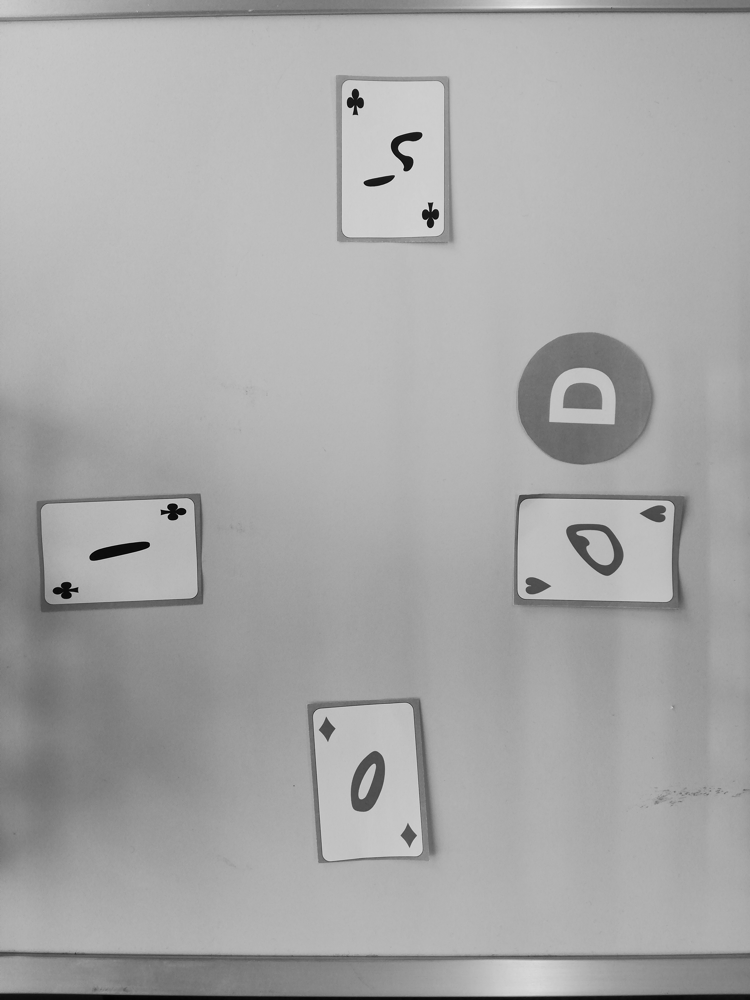

In [6]:
df = segment_and_plot_cards_and_dealer(dict_data['game3']['round7'])